# Relativistic average GAN with Keras custom loss
This python notebook is using custom layers in Keras to implement Relativistic average GAN.
- Pros: 
    - Easly using keras default loss to train our RaGAN
- Cons: 
    - Write custom layers to implement it.

## Let install and import some package

### Install pydot and graphviz for keras model visualization
If you using google colab, please restart your runtime after you install pydot and graphviz

In [1]:
!apt install graphviz
!pip install -q pydot

E: Could not open lock file /var/lib/dpkg/lock - open (13: Permission denied)
E: Unable to lock the administration directory (/var/lib/dpkg/), are you root?


### Import packege

In [2]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Lambda, Conv2D, Conv2DTranspose, Activation, LeakyReLU, Concatenate
from keras.layers import BatchNormalization, GlobalAveragePooling2D, Reshape
import keras.backend as K
from keras.models import Model
from keras.utils import plot_model
from keras.optimizers import *
from keras.utils.generic_utils import Progbar
from time import time
import sys
import os
import pickle

Using TensorFlow backend.


### for model visualization

In [3]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

## Some model strature, hyperperemeter and dataset choosing

In [4]:
EPOCHS = 100
BATCHSIZE = 64
TRAINING_RATIO =1
DATASET = 'fashion_mnist' # 'mnist', 'fashion_mnist'  'cifar10'
LOSS = 'BXE' #'BXE' 'LS'
GENERATE_ROW_NUM = 10
OPT = Adam(lr=0.0002, beta_1=0.5, beta_2=0.999)

### load dataset

In [5]:
from keras.datasets import mnist, fashion_mnist, cifar10
exec('(X_train, y_train), (X_test, y_test) = {}.load_data()'.format(DATASET))

### Conatenate train set and test set for more data, reshape for model input and normalize it (here we use linear normalization)

In [6]:
X = np.concatenate((X_train, X_test))
if len(X.shape)==3:
    X = np.expand_dims(X, axis=-1)
X = X/255*2-1

## Build model stucture. Here we use DCGAN stucture

In [7]:
def DC_Generator(input_shape=(128,) ,output_shape=(28,28,1), dc_shape=(7,7,128), name='Generator'):
    layer_num=int(np.log2(output_shape[1]/dc_shape[1]))
    
    z = Input(shape=input_shape)
    h = Dense(dc_shape[0]*dc_shape[1]*dc_shape[2], activation='relu',kernel_initializer='glorot_uniform')(z)
    h = Reshape(dc_shape)(h) 
    for i in range(layer_num):  
        h = Conv2DTranspose(int(dc_shape[2]/(2**(i+1))), kernel_size=4, strides=2, padding='same', activation='relu',kernel_initializer='glorot_uniform')(h)
        h = BatchNormalization(momentum=0.9, epsilon=0.00002)(h)
    
    x = Conv2DTranspose(output_shape[-1], kernel_size=3, strides=1, padding='same', activation='tanh',kernel_initializer='glorot_uniform')(h)
    model = Model(z,x, name=name)
    model.summary()
    return model

def DC_Discriminator(input_shape=(28,28,1),layer_num=2, start_dim=64, name='Discriminator'):
    
    x = Input(shape=input_shape)
    h = x
    for i in range(layer_num):
        h = Conv2D(start_dim*(2**i), kernel_size=4, strides=2, padding='same',kernel_initializer='glorot_uniform')(h)
        h = LeakyReLU(0.1)(h)       
    
    h = GlobalAveragePooling2D()(h)
    y = Dense(1,kernel_initializer='glorot_uniform' )(h)
    model = Model(x,y, name=name)
    model.summary()
    return model

In [8]:
if X.shape[2] == 28:
    dc_shape = (7,7,128)
    dis_layer_num = 2
else:
    dc_shape = (4,4,512)
    dis_layer_num = 4
generator = DC_Generator(output_shape=X.shape[1:], dc_shape=dc_shape)
discriminator = DC_Discriminator(input_shape=X.shape[1:], layer_num=dis_layer_num)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6272)              809088    
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 64)        131136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 28, 28, 32)        32800     
_________________________________________________________________
batch_normalization_2 (Batch (None, 28, 28, 32)        128       
__________

## Build two models for training 

In [9]:
Real_image                         = Input(shape=X.shape[1:])
Noise_input                        = Input(shape=(128,))
Fake_image                         = generator(Noise_input)
Discriminator_real_out             = discriminator(Real_image)
Discriminator_fake_out             = discriminator(Fake_image)

## *Custom Loss*
### use ```keras.backend as K``` for relativistic average
We need to average $C(x_{real})$ and $C(x_{fake})$. 
and minus with each other to get $C(x_{real})-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}C(x_{fake})$ and $C(x_{fake})-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}C(x_{real})$.

In [10]:
Discriminator_fake_average_out = K.mean(Discriminator_fake_out, axis=0)
Discriminator_real_average_out = K.mean(Discriminator_real_out, axis=0)
Real_Fake_relativistic_average_out = Discriminator_real_out - Discriminator_fake_average_out
Fake_Real_relativistic_average_out = Discriminator_fake_out - Discriminator_real_average_out

### Build loss
### Binary cross entorpy
$$L_D = -\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}[\log \tilde{D}(x_{real})]-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}[\log ( 1-\tilde{D}(x_{fake}))]$$
$$L_G = -\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}[\log \tilde{D}(x_{fake})]-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}[\log ( 1-\tilde{D}(x_{real}))]$$
note that
$$\tilde{D}(x_{real})=\text{sigmoid}(C(x_{real})-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}C(x_{fake}))$$ $$\tilde{D}(x_{fake})=\text{sigmoid}(C(x_{fake})-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}C(x_{real}))$$
### Least Square
$$L_D = \mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}[(\tilde{D}(x_{real})-1)^2]+\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}[(\tilde{D}(x_{fake})+1)^2]$$
$$L_G = \mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}[(\tilde{D}(x_{fake})-1)^2]+\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}[(\tilde{D}(x_{real})+1)^2]$$
note that
$$\tilde{D}(x_{real})=C(x_{real})-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}C(x_{fake})$$ 
$$\tilde{D}(x_{fake})=C(x_{fake})-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}C(x_{real})$$

In [11]:
if LOSS=='BXE':
    epsilon=0.000001 # for avoid log(0)
    def relativistic_discriminator_loss(y_true, y_pred):
        '''
        y_true and y_pred are not be used
        use keras tensor to compute loss
        '''
        return -(K.mean(K.log(K.sigmoid(Real_Fake_relativistic_average_out)+epsilon ),axis=0)+K.mean(K.log(1-K.sigmoid(Fake_Real_relativistic_average_out)+epsilon),axis=0))
    def relativistic_generator_loss(y_true, y_pred):
        '''
        y_true and y_pred are not be used
        use keras tensor to compute loss

        '''
        return -(K.mean(K.log(K.sigmoid(Fake_Real_relativistic_average_out)+epsilon),axis=0)+K.mean(K.log(1-K.sigmoid(Real_Fake_relativistic_average_out)+epsilon),axis=0))
elif LOSS=='LS':
    def relativistic_discriminator_loss(y_true, y_pred):
        '''
        y_true and y_pred are not be used
        use keras tensor to compute loss

        '''
        return K.mean(K.pow(Real_Fake_relativistic_average_out-1,2),axis=0)+K.mean(K.pow(Fake_Real_relativistic_average_out+1,2),axis=0)
    def relativistic_generator_loss(y_true, y_pred):
        '''
        y_true and y_pred are be used
        use keras tensor to compute loss

        '''
        return K.mean(K.pow(Fake_Real_relativistic_average_out-1,2),axis=0)+K.mean(K.pow(Real_Fake_relativistic_average_out+1,2),axis=0)

### First, build model for train generator
Remember we should make discriminator untrainable before we compile it

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 128)          0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
Generator (Model)               (None, 28, 28, 1)    973697      input_4[0][0]                    
__________________________________________________________________________________________________
Discriminator (Model)           (None, 1)            132417      input_3[0][0]                    
                                                                 Generator[1][0]                  
Total para

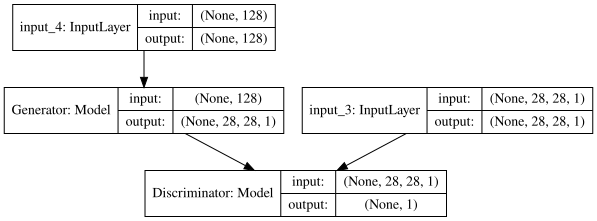

In [12]:
generator_train = Model([Noise_input, Real_image], [Discriminator_real_out, Discriminator_fake_out])
discriminator.trainable=False
generator_train.compile(OPT, loss=[relativistic_generator_loss, None])
generator_train.summary()
SVG(model_to_dot(generator_train, show_shapes=True).create(prog='dot', format='svg'))

### Second, build model for train dicriminator
Remember we should make discriminator trainable and generator untrainable before we compile it

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 128)          0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
Generator (Model)               (None, 28, 28, 1)    973697      input_4[0][0]                    
__________________________________________________________________________________________________
Discriminator (Model)           (None, 1)            132417      input_3[0][0]                    
                                                                 Generator[1][0]                  
Total para

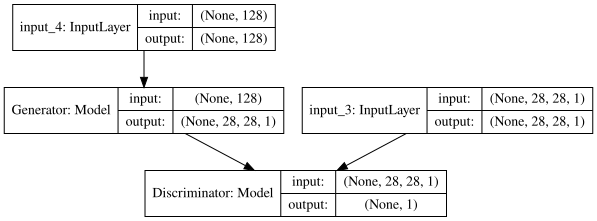

In [13]:
discriminator_train = Model([Noise_input, Real_image], [Discriminator_real_out, Discriminator_fake_out])
generator.trainable = False
discriminator.trainable=True
discriminator_train.compile(OPT, loss=[relativistic_discriminator_loss, None])
discriminator_train.summary()
SVG(model_to_dot(discriminator_train, show_shapes=True).create(prog='dot', format='svg'))

## Generator label $y$ for fitting

In [14]:
dummy_y = np.zeros((BATCHSIZE, 1), dtype=np.float32)

## Generate test noise

In [15]:
GENERATE_BATCHSIZE = GENERATE_ROW_NUM*GENERATE_ROW_NUM
test_noise = np.random.randn(GENERATE_BATCHSIZE, 128)

## Train the model

epoch 1 of 100
number of batches: 546
545/546 [============================>.] - ETA: 0s
epoch time: 17.298874616622925
plot generated_image
plot Loss


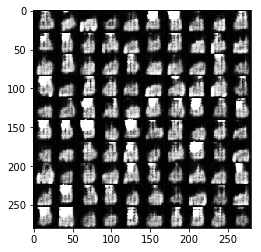

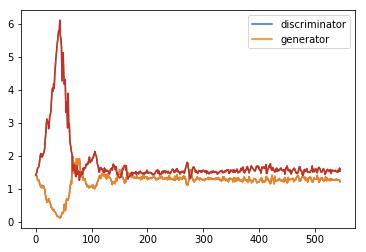

epoch 2 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.687902450561523
plot generated_image
plot Loss


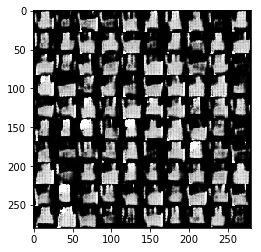

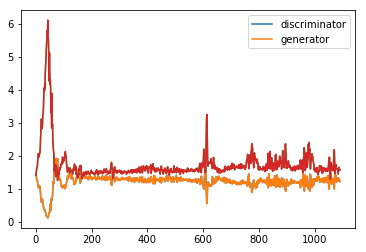

epoch 3 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.685096025466919
plot generated_image
plot Loss


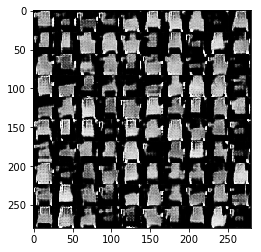

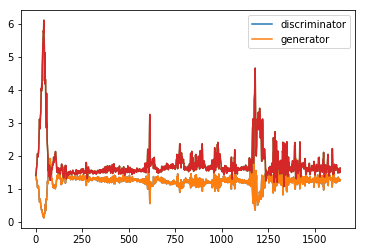

epoch 4 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.755073308944702
plot generated_image
plot Loss


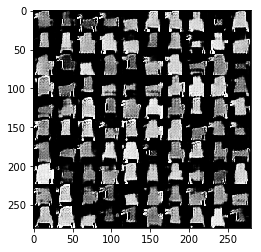

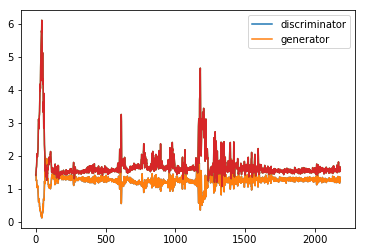

epoch 5 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.76219916343689
plot generated_image
plot Loss


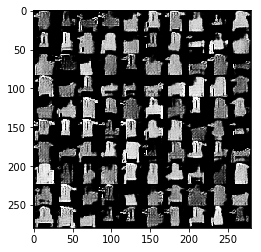

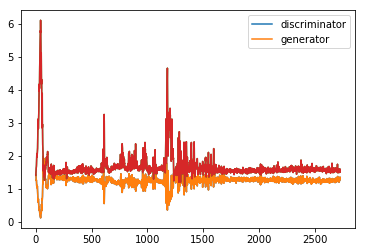

epoch 6 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.729188203811646
plot generated_image
plot Loss


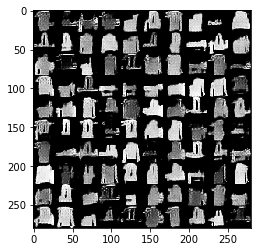

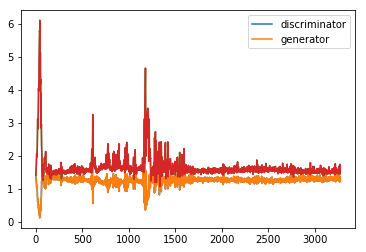

epoch 7 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.728477001190186
plot generated_image
plot Loss


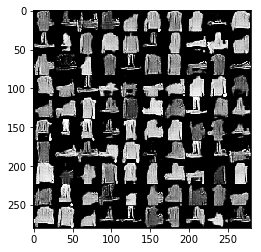

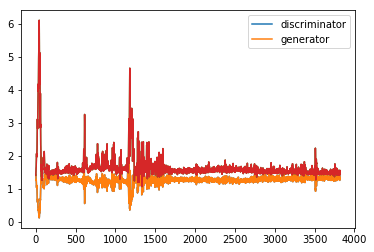

epoch 8 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.704368829727173
plot generated_image
plot Loss


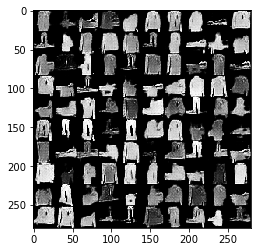

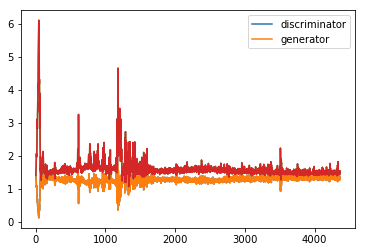

epoch 9 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.693664073944092
plot generated_image
plot Loss


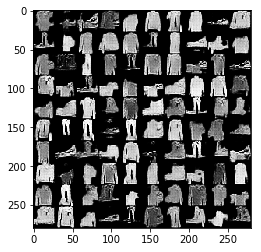

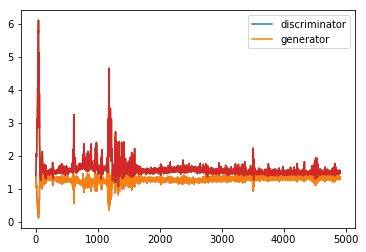

epoch 10 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.684822797775269
plot generated_image
plot Loss


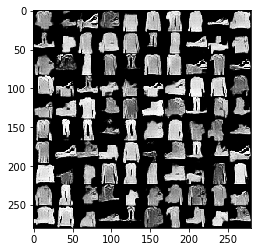

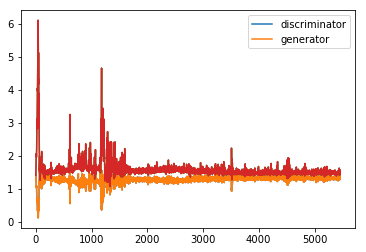

epoch 11 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.681607484817505
plot generated_image
plot Loss


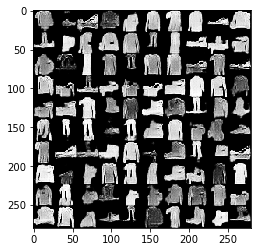

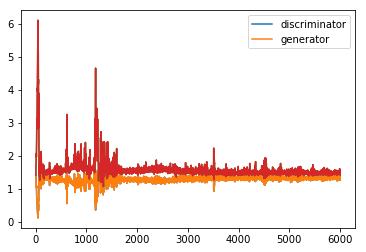

epoch 12 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.670855045318604
plot generated_image
plot Loss


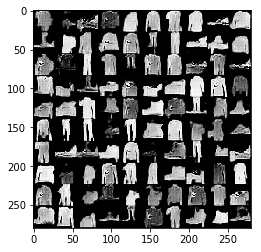

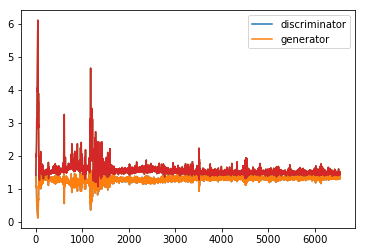

epoch 13 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.658771753311157
plot generated_image
plot Loss


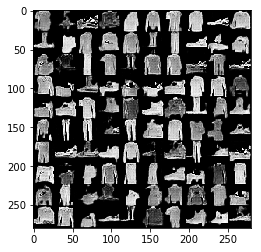

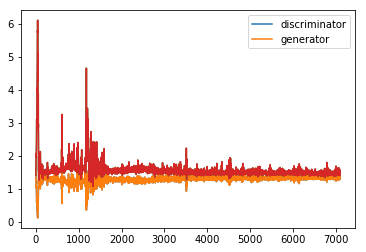

epoch 14 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.64688777923584
plot generated_image
plot Loss


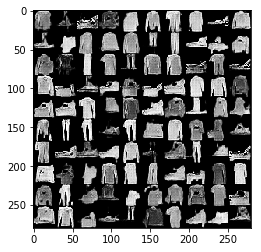

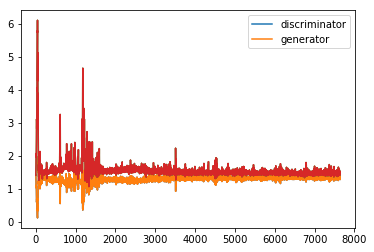

epoch 15 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.6699059009552
plot generated_image
plot Loss


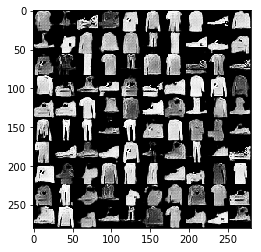

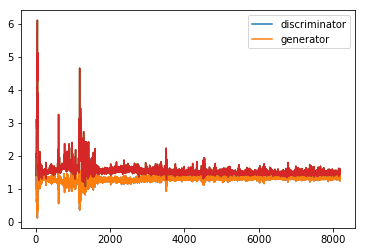

epoch 16 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.64797067642212
plot generated_image
plot Loss


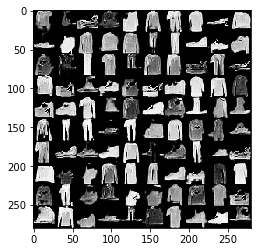

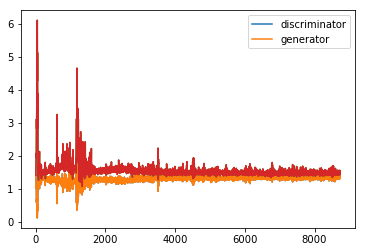

epoch 17 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.65296721458435
plot generated_image
plot Loss


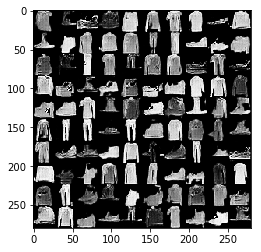

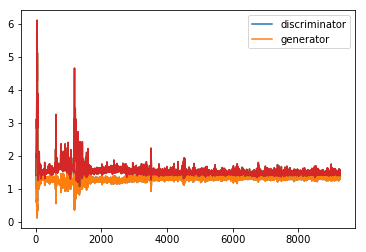

epoch 18 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.662225484848022
plot generated_image
plot Loss


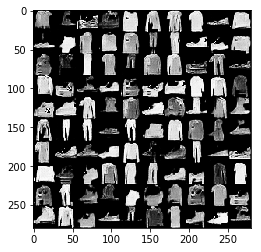

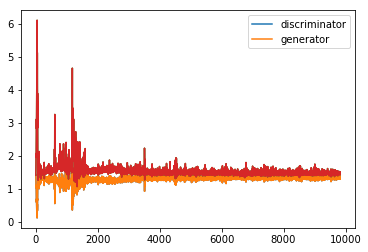

epoch 19 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.622143745422363
plot generated_image
plot Loss


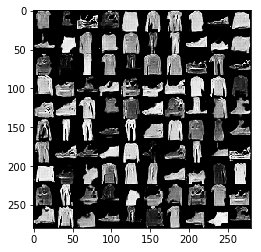

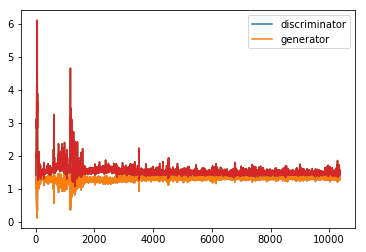

epoch 20 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.657045125961304
plot generated_image
plot Loss


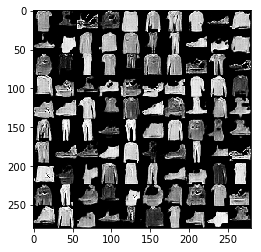

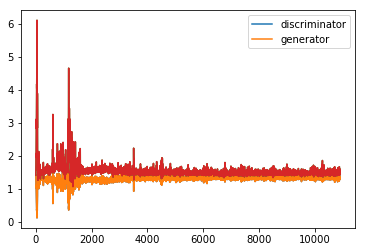

epoch 21 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.64120864868164
plot generated_image
plot Loss


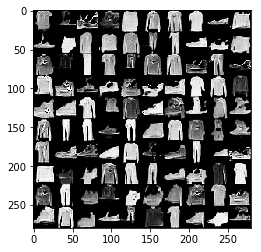

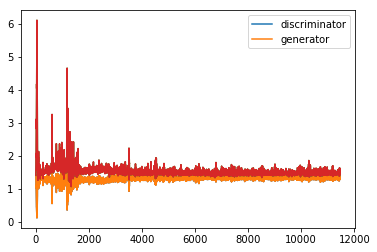

epoch 22 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.642416000366211
plot generated_image
plot Loss


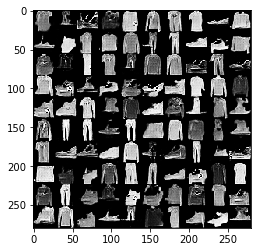

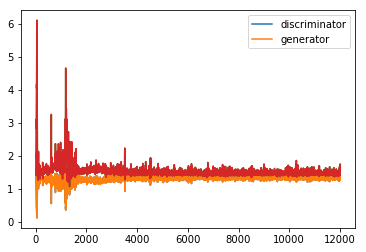

epoch 23 of 100
number of batches: 546
545/546 [============================>.] - ETA: 0s
epoch time: 14.73091435432434
plot generated_image
plot Loss


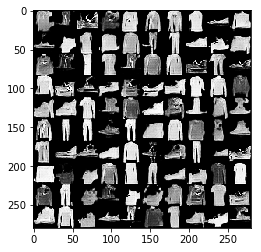

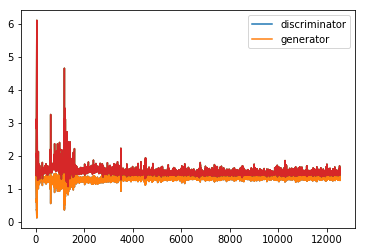

epoch 24 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.64432692527771
plot generated_image
plot Loss


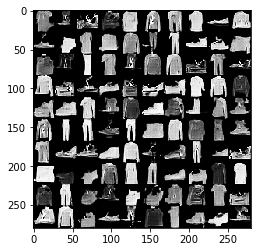

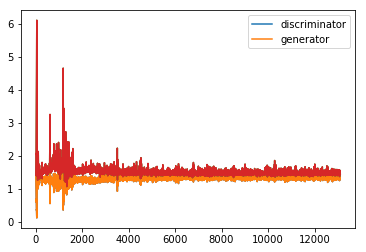

epoch 25 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.642279624938965
plot generated_image
plot Loss


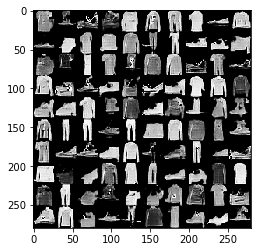

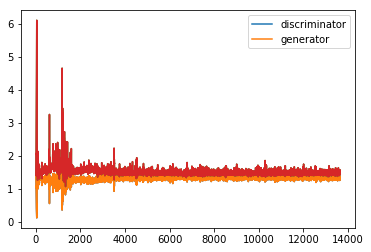

epoch 26 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.632988214492798
plot generated_image
plot Loss


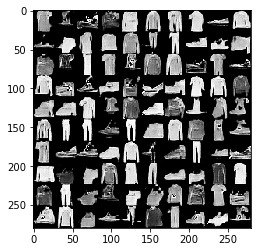

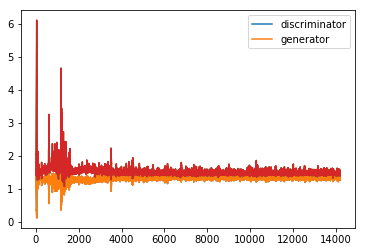

epoch 27 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.626664876937866
plot generated_image
plot Loss


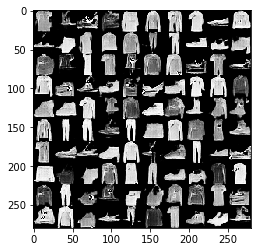

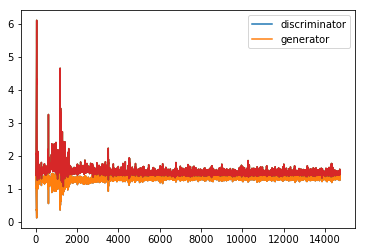

epoch 28 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.62766170501709
plot generated_image
plot Loss


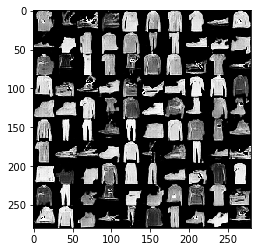

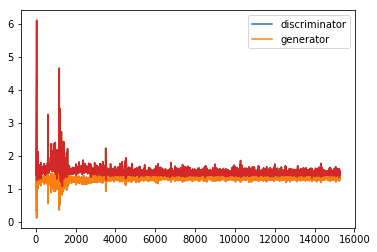

epoch 29 of 100
number of batches: 546
545/546 [============================>.] - ETA: 0s
epoch time: 14.688575267791748
plot generated_image
plot Loss


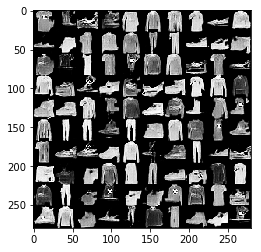

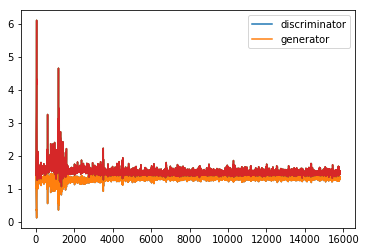

epoch 30 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.614245176315308
plot generated_image
plot Loss


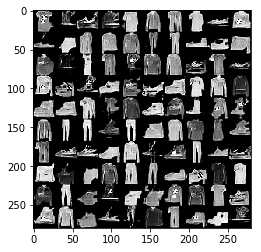

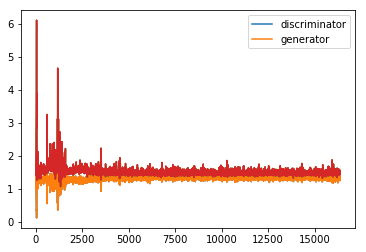

epoch 31 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.624132871627808
plot generated_image
plot Loss


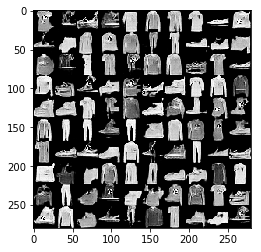

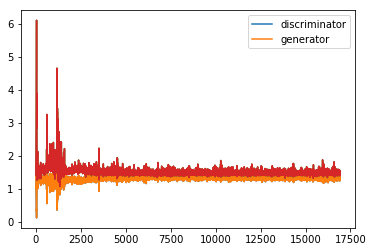

epoch 32 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.612242698669434
plot generated_image
plot Loss


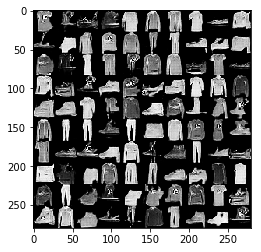

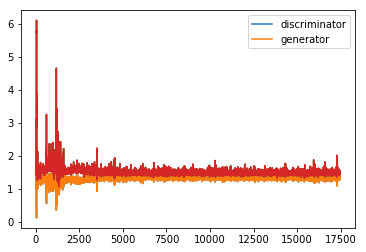

epoch 33 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.629717350006104
plot generated_image
plot Loss


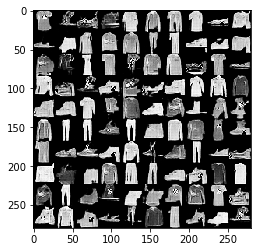

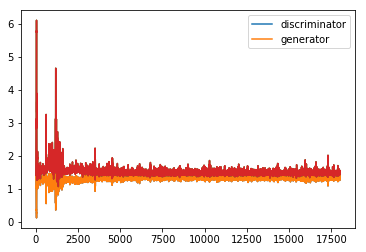

epoch 34 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.630454778671265
plot generated_image
plot Loss


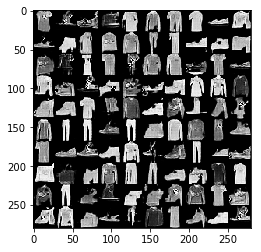

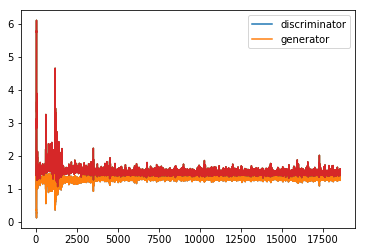

epoch 35 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.604036569595337
plot generated_image
plot Loss


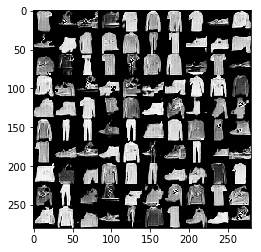

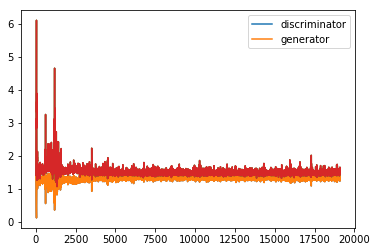

epoch 36 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.626774787902832
plot generated_image
plot Loss


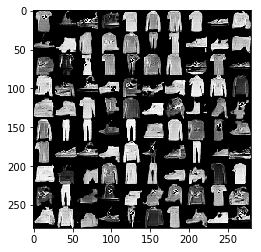

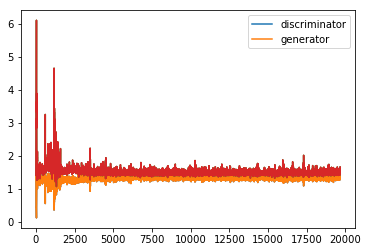

epoch 37 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.599905967712402
plot generated_image
plot Loss


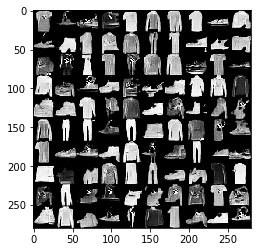

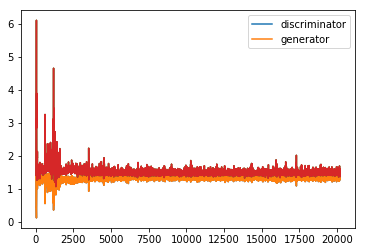

epoch 38 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.597651243209839
plot generated_image
plot Loss


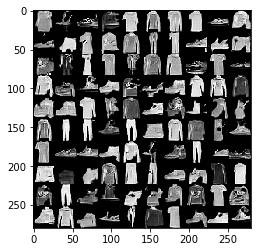

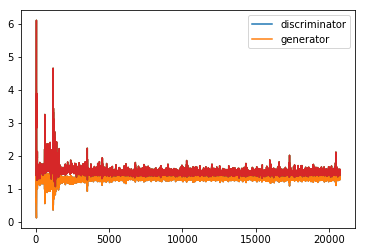

epoch 39 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.620499849319458
plot generated_image
plot Loss


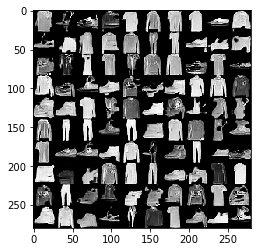

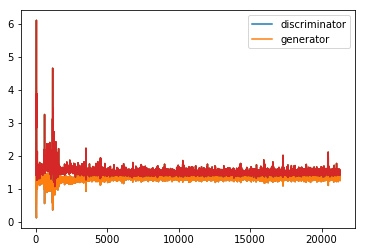

epoch 40 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.596406698226929
plot generated_image
plot Loss


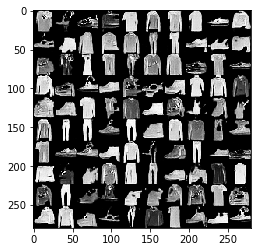

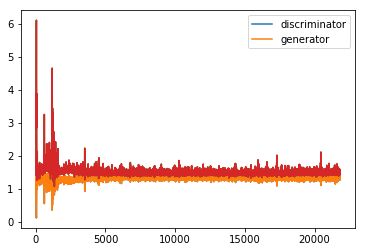

epoch 41 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.60603642463684
plot generated_image
plot Loss


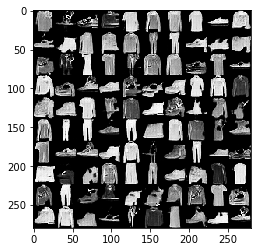

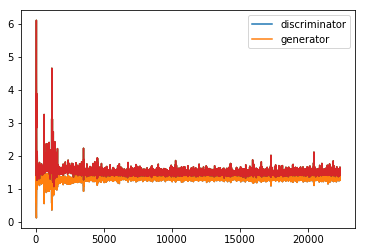

epoch 42 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.586363315582275
plot generated_image
plot Loss


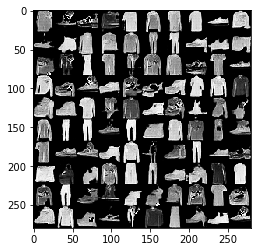

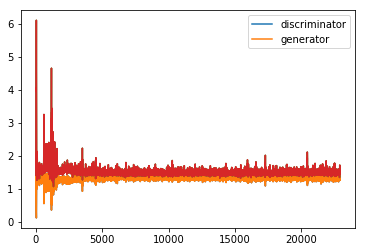

epoch 43 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.596128702163696
plot generated_image
plot Loss


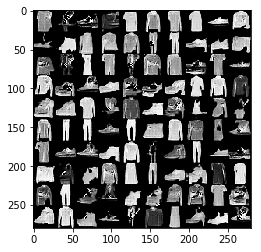

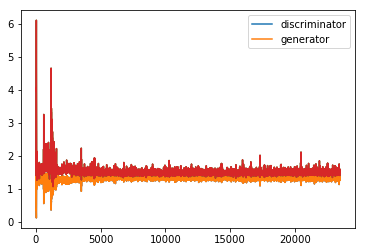

epoch 44 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.596636772155762
plot generated_image
plot Loss


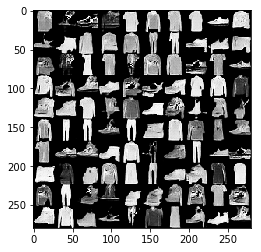

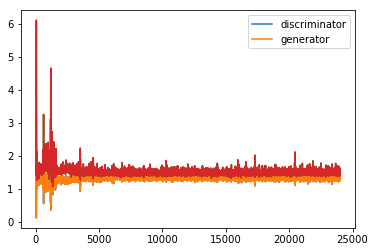

epoch 45 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.608419418334961
plot generated_image
plot Loss


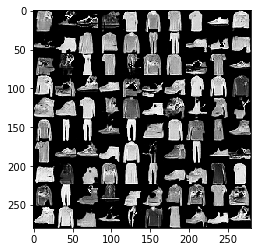

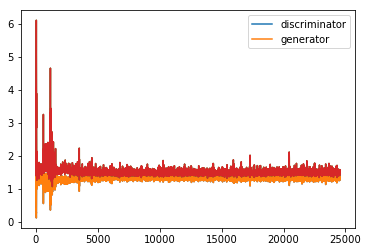

epoch 46 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.598369836807251
plot generated_image
plot Loss


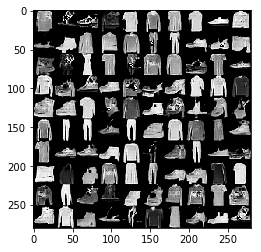

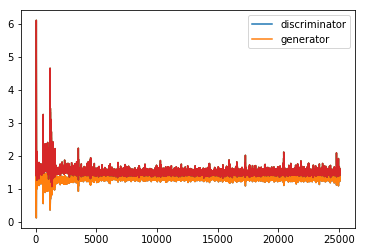

epoch 47 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.585192441940308
plot generated_image
plot Loss


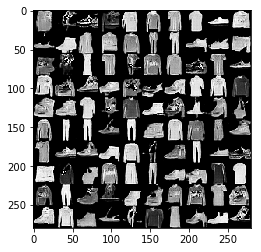

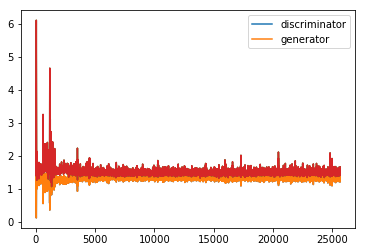

epoch 48 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.583978414535522
plot generated_image
plot Loss


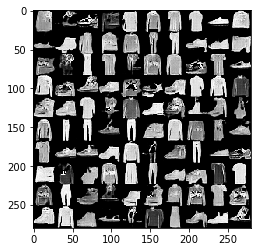

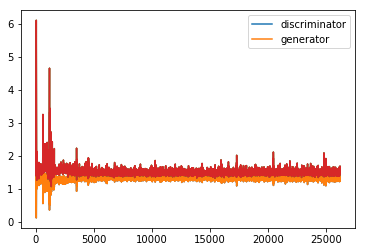

epoch 49 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.602756261825562
plot generated_image
plot Loss


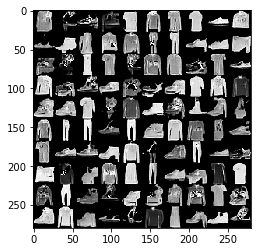

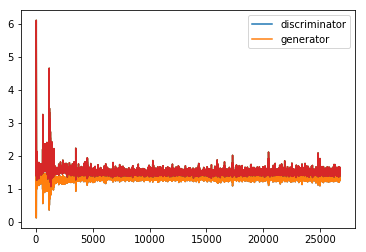

epoch 50 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.573649644851685
plot generated_image
plot Loss


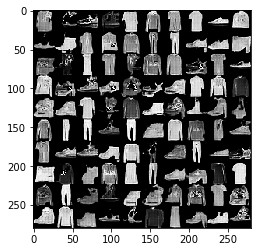

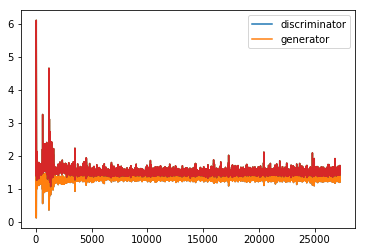

epoch 51 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.580332517623901
plot generated_image
plot Loss


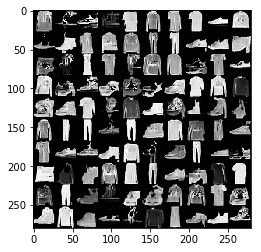

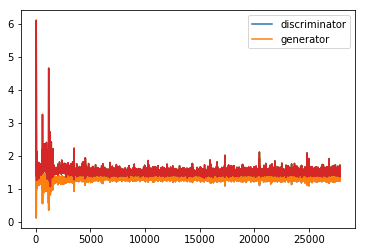

epoch 52 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.57127857208252
plot generated_image
plot Loss


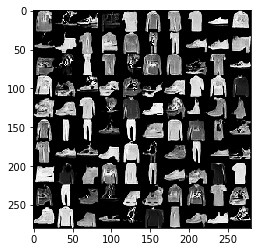

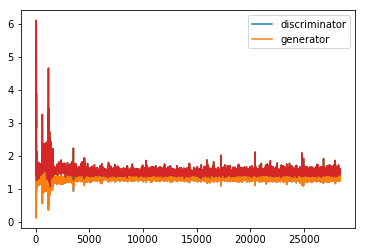

epoch 53 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.592664003372192
plot generated_image
plot Loss


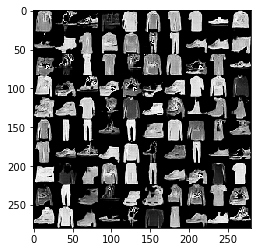

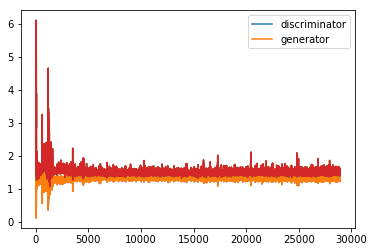

epoch 54 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.57237195968628
plot generated_image
plot Loss


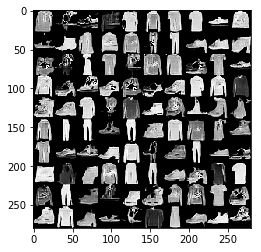

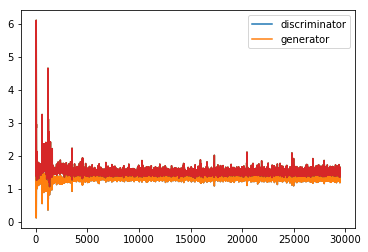

epoch 55 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.572558403015137
plot generated_image
plot Loss


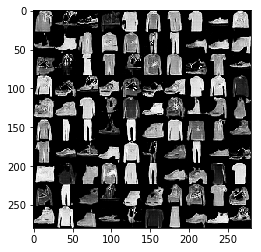

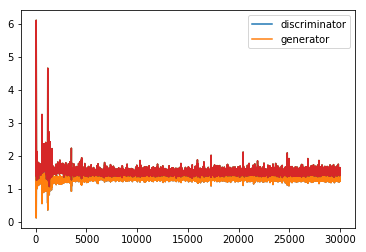

epoch 56 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.56067943572998
plot generated_image
plot Loss


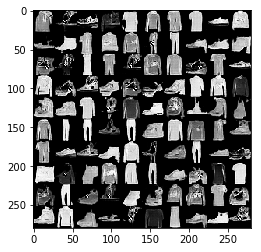

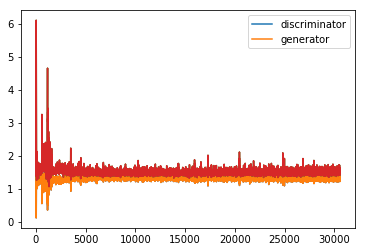

epoch 57 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.598258256912231
plot generated_image
plot Loss


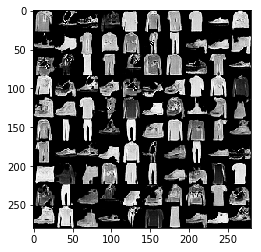

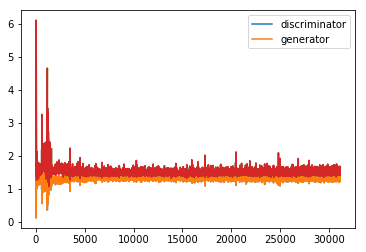

epoch 58 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.573089122772217
plot generated_image
plot Loss


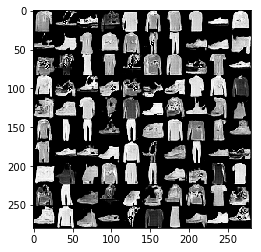

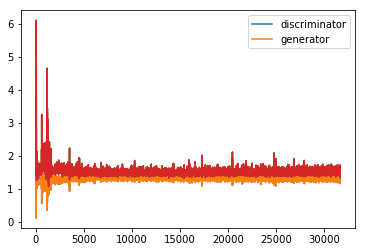

epoch 59 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.595695972442627
plot generated_image
plot Loss


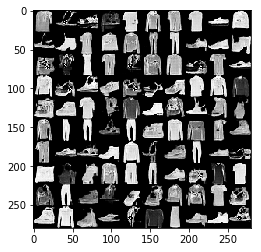

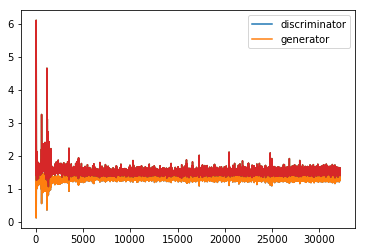

epoch 60 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.562060117721558
plot generated_image
plot Loss


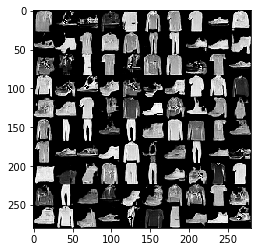

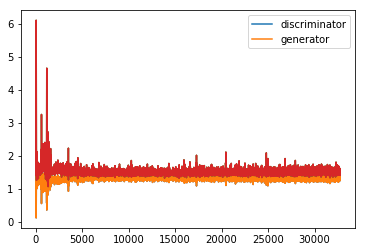

epoch 61 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.565339088439941
plot generated_image
plot Loss


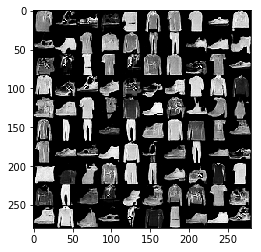

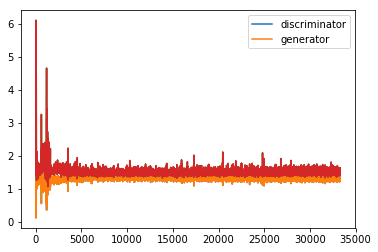

epoch 62 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.553470134735107
plot generated_image
plot Loss


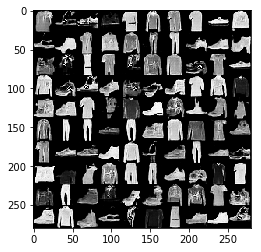

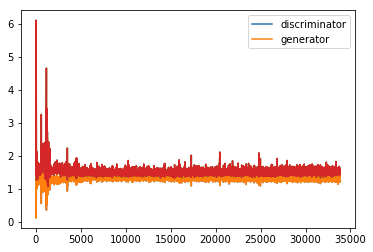

epoch 63 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.565157175064087
plot generated_image
plot Loss


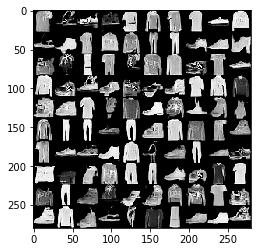

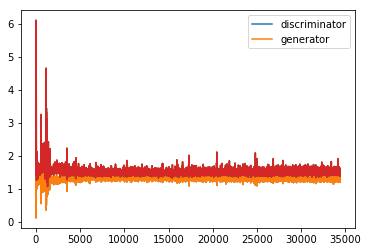

epoch 64 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.589333772659302
plot generated_image
plot Loss


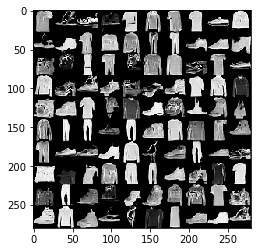

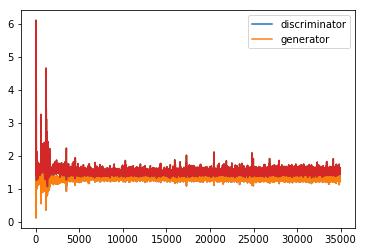

epoch 65 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.605394124984741
plot generated_image
plot Loss


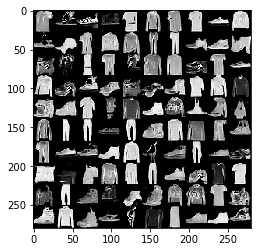

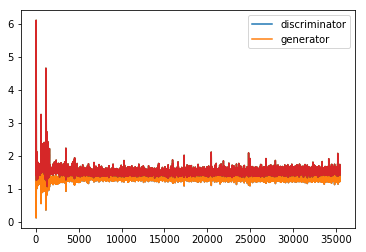

epoch 66 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.559742212295532
plot generated_image
plot Loss


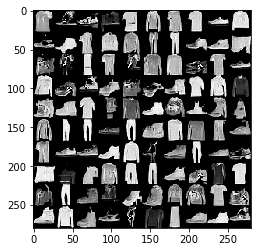

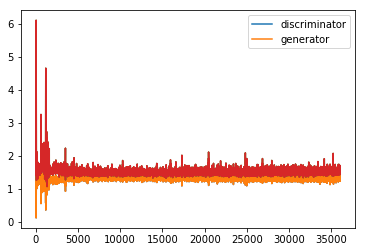

epoch 67 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.57236385345459
plot generated_image
plot Loss


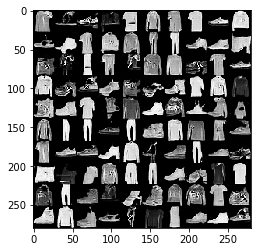

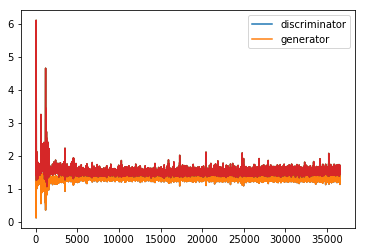

epoch 68 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.5629243850708
plot generated_image
plot Loss


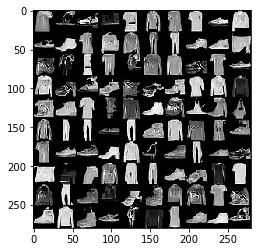

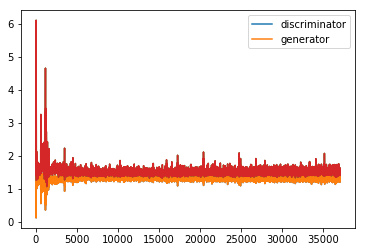

epoch 69 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.56240200996399
plot generated_image
plot Loss


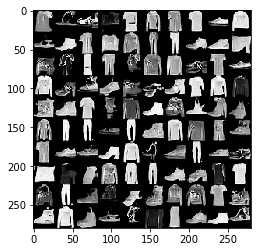

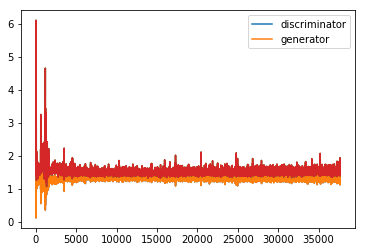

epoch 70 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.570786714553833
plot generated_image
plot Loss


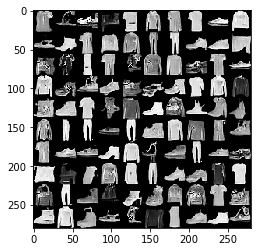

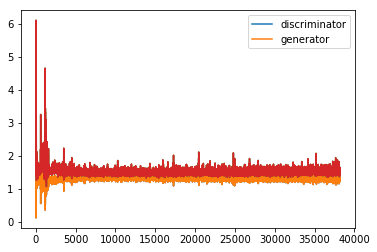

epoch 71 of 100
number of batches: 546
545/546 [============================>.] - ETA: 0s
epoch time: 14.651832818984985
plot generated_image
plot Loss


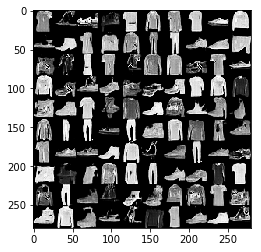

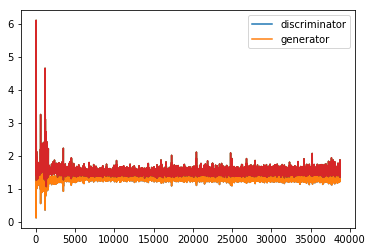

epoch 72 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.562618494033813
plot generated_image
plot Loss


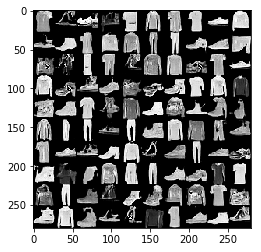

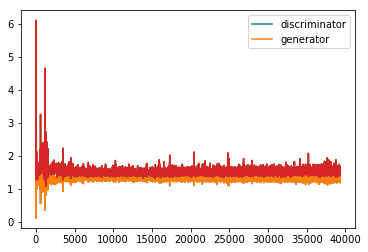

epoch 73 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.59660267829895
plot generated_image
plot Loss


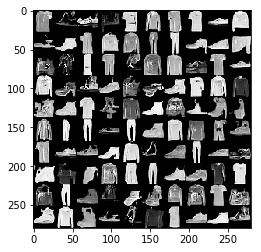

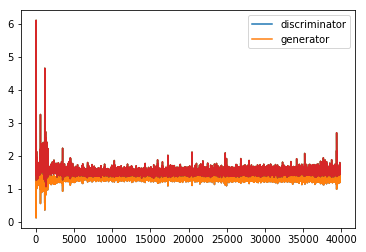

epoch 74 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.546879768371582
plot generated_image
plot Loss


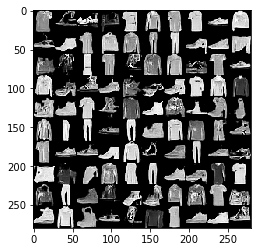

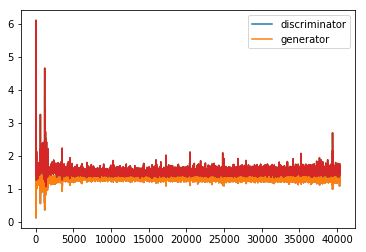

epoch 75 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.557785749435425
plot generated_image
plot Loss


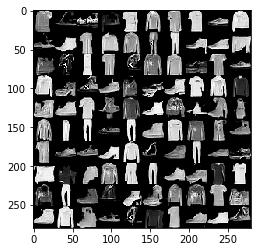

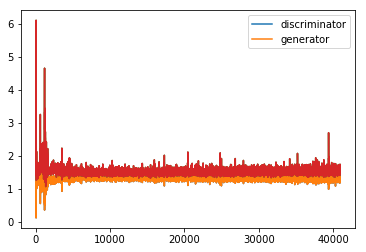

epoch 76 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.54576325416565
plot generated_image
plot Loss


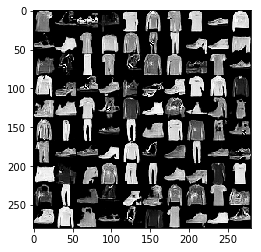

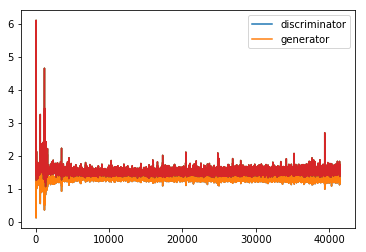

epoch 77 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.546796560287476
plot generated_image
plot Loss


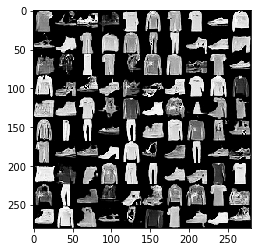

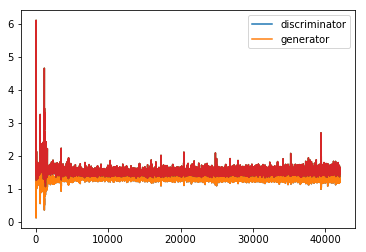

epoch 78 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.535902500152588
plot generated_image
plot Loss


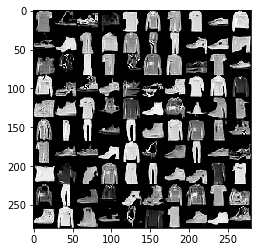

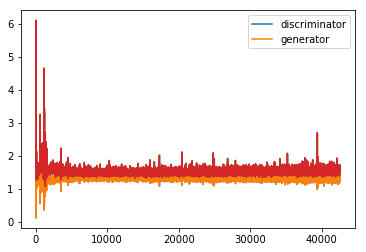

epoch 79 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.53769850730896
plot generated_image
plot Loss


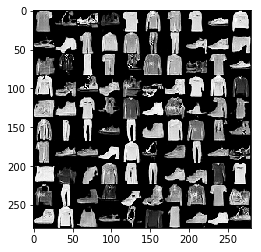

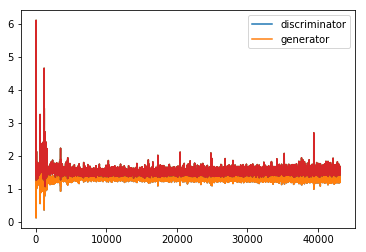

epoch 80 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.558950424194336
plot generated_image
plot Loss


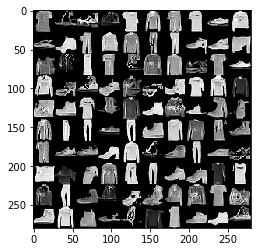

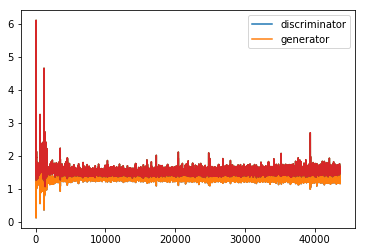

epoch 81 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.592992067337036
plot generated_image
plot Loss


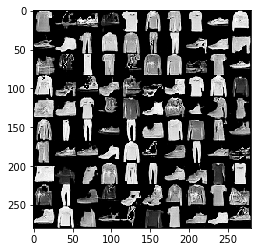

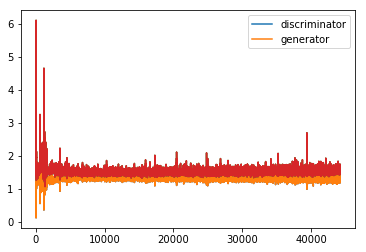

epoch 82 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.56317400932312
plot generated_image
plot Loss


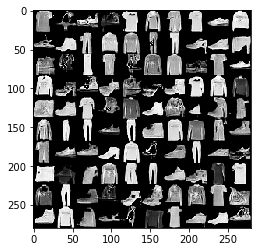

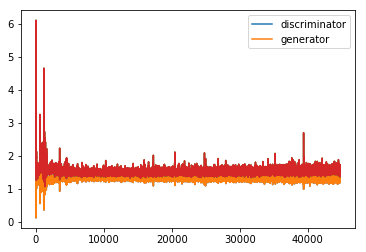

epoch 83 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.556700468063354
plot generated_image
plot Loss


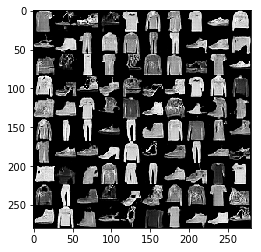

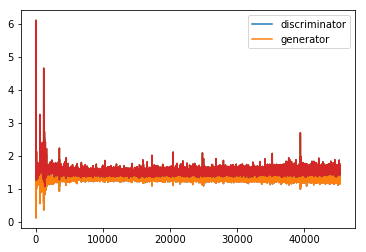

epoch 84 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.54103422164917
plot generated_image
plot Loss


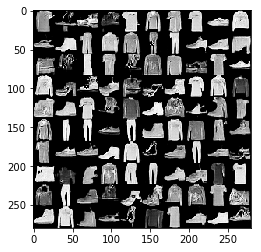

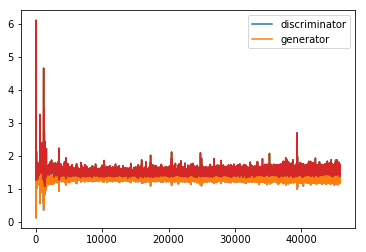

epoch 85 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.548304557800293
plot generated_image
plot Loss


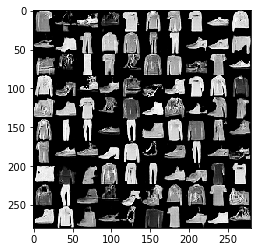

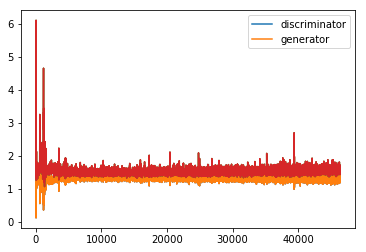

epoch 86 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.54050064086914
plot generated_image
plot Loss


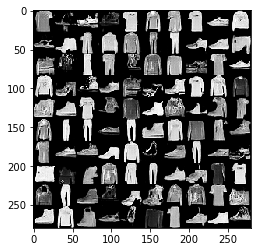

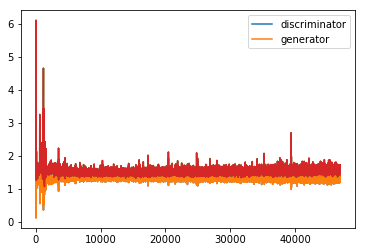

epoch 87 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.550256967544556
plot generated_image
plot Loss


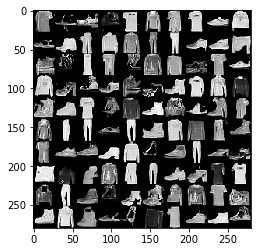

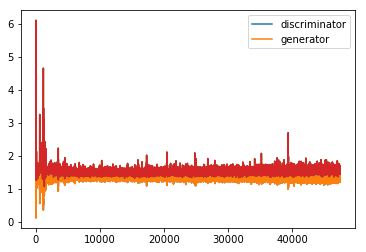

epoch 88 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.545714139938354
plot generated_image
plot Loss


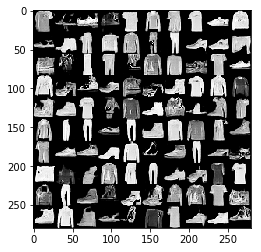

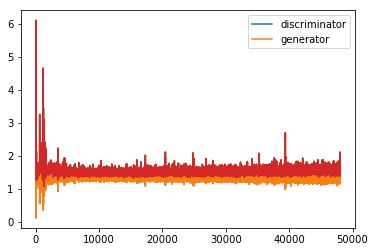

epoch 89 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.584684133529663
plot generated_image
plot Loss


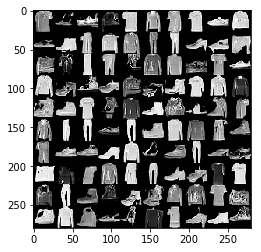

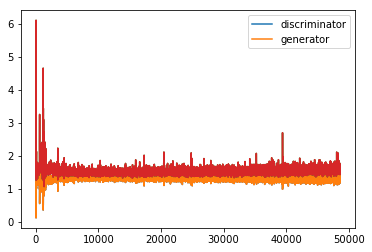

epoch 90 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.53753924369812
plot generated_image
plot Loss


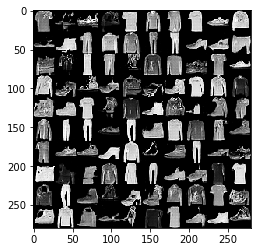

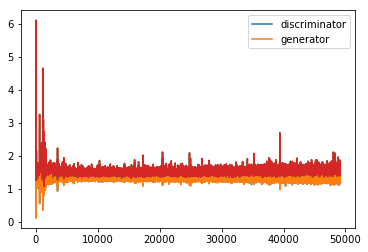

epoch 91 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.551114559173584
plot generated_image
plot Loss


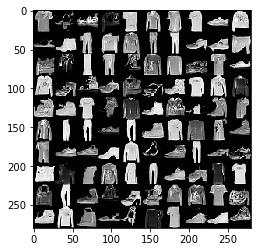

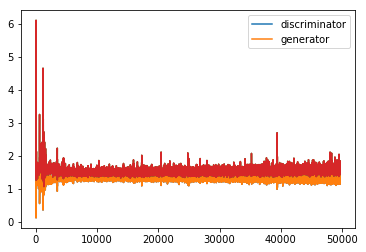

epoch 92 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.550657749176025
plot generated_image
plot Loss


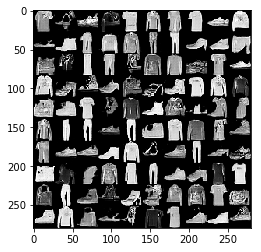

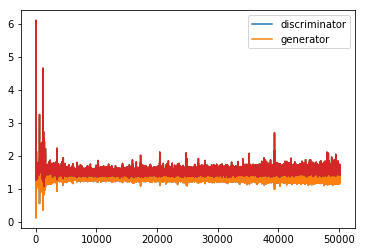

epoch 93 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.563374042510986
plot generated_image
plot Loss


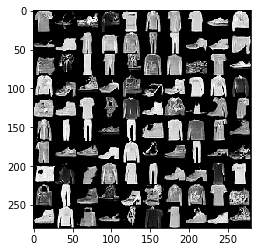

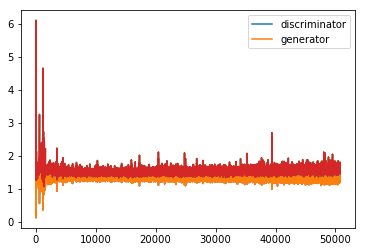

epoch 94 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.541412115097046
plot generated_image
plot Loss


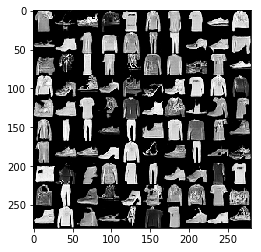

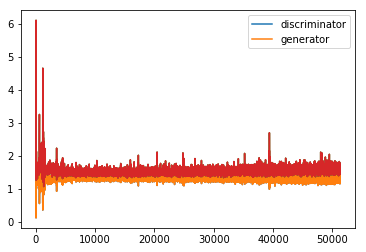

epoch 95 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.532334804534912
plot generated_image
plot Loss


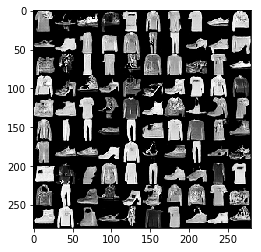

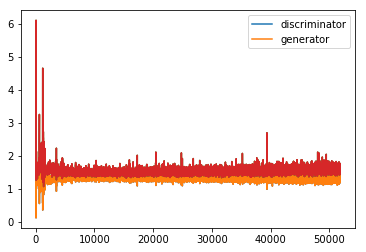

epoch 96 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.566380977630615
plot generated_image
plot Loss


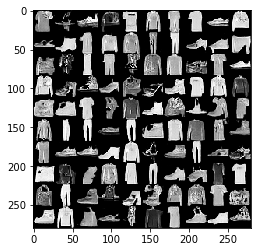

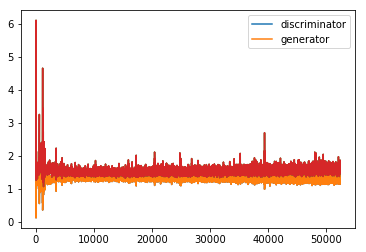

epoch 97 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.566042423248291
plot generated_image
plot Loss


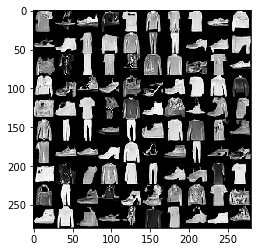

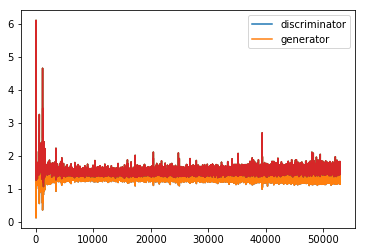

epoch 98 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.56364893913269
plot generated_image
plot Loss


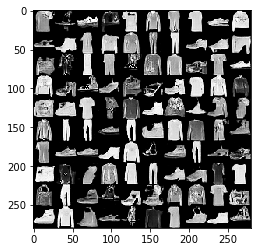

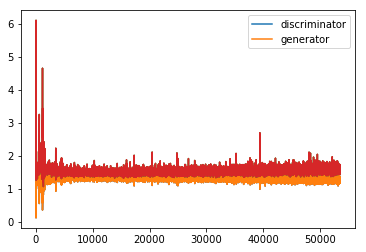

epoch 99 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.523770332336426
plot generated_image
plot Loss


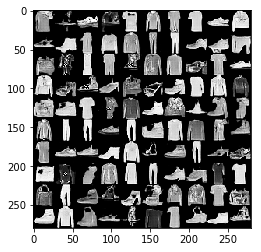

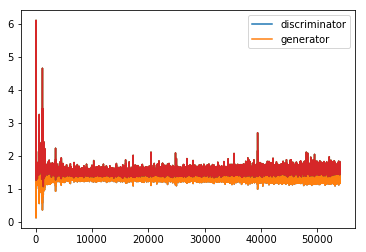

epoch 100 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.53251338005066
plot generated_image
plot Loss


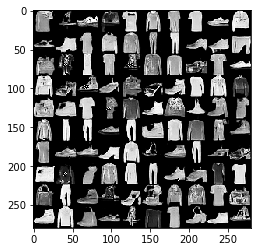

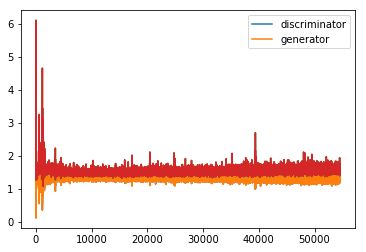

In [16]:
discriminator_loss = list()
generator_loss = list()
for epoch in range(EPOCHS):
    
    np.random.shuffle(X)

    print("epoch {} of {}".format(epoch+1, EPOCHS))
    num_batches = int(X.shape[0] // BATCHSIZE)
    minibatches_size = BATCHSIZE * (TRAINING_RATIO+1)
    print("number of batches: {}".format(int(X.shape[0] // (minibatches_size))))
    
    progress_bar = Progbar(target=int(X.shape[0] // minibatches_size))
    plt.clf()
    start_time = time()
    for index in range(int(X.shape[0] // (minibatches_size))):
        progress_bar.update(index)
        itreation_minibatches = X[index * minibatches_size:(index + 1) * minibatches_size]

        for j in range(TRAINING_RATIO):
            image_batch = itreation_minibatches[j * BATCHSIZE : (j + 1) * BATCHSIZE]
            noise = np.random.randn(BATCHSIZE, 128).astype(np.float32)
            discriminator.trainable = True
            generator.trainable = False
            discriminator_loss.append(discriminator_train.train_on_batch([noise, image_batch],dummy_y))
            
        image_batch = itreation_minibatches[TRAINING_RATIO*BATCHSIZE : (TRAINING_RATIO + 1) * BATCHSIZE]
        noise = np.random.randn(BATCHSIZE, 128).astype(np.float32)
        discriminator.trainable = False
        generator.trainable = True
        generator_loss.append(generator_train.train_on_batch([noise, image_batch], dummy_y))

    print('\nepoch time: {}'.format(time()-start_time))
    
    generated_image = generator.predict(test_noise)
    generated_image = (generated_image+1)/2
    for i in range(GENERATE_ROW_NUM):
        if X.shape[3]==1:
            new = generated_image[i*GENERATE_ROW_NUM:i*GENERATE_ROW_NUM+GENERATE_ROW_NUM].reshape(X.shape[2]*GENERATE_ROW_NUM,X.shape[2])
        else:
            new = generated_image[i*GENERATE_ROW_NUM:i*GENERATE_ROW_NUM+GENERATE_ROW_NUM].reshape(X.shape[2]*GENERATE_ROW_NUM,X.shape[2], 3)
        if i!=0:
            old = np.concatenate((old,new),axis=1)
        else:
            old = new
    print('plot generated_image')
    plt.figure()
    if X.shape[-1]==1:
        plt.imshow(old, cmap='gray')
    else:
        plt.imshow(old)
    print('plot Loss')
    plt.figure()
    plt.plot(discriminator_loss)
    plt.plot(generator_loss)
    plt.legend(['discriminator', 'generator'])
    plt.show()